In [243]:
import cv2
import scipy
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

In [244]:
plt.style.use('seaborn-v0_8')
# plt.rcParams["grid.linestyle"] = "--"
plt.rcParams["grid.alpha"] = 0

plt.rcParams["figure.figsize"] = (30, 10)

In [245]:
buffy = cv2.imread("img/buffy_headphones.png")
buffy_rgb = cv2.cvtColor(buffy, cv2.COLOR_BGR2RGB)
buffy_gray = cv2.cvtColor(buffy, cv2.COLOR_RGB2GRAY)

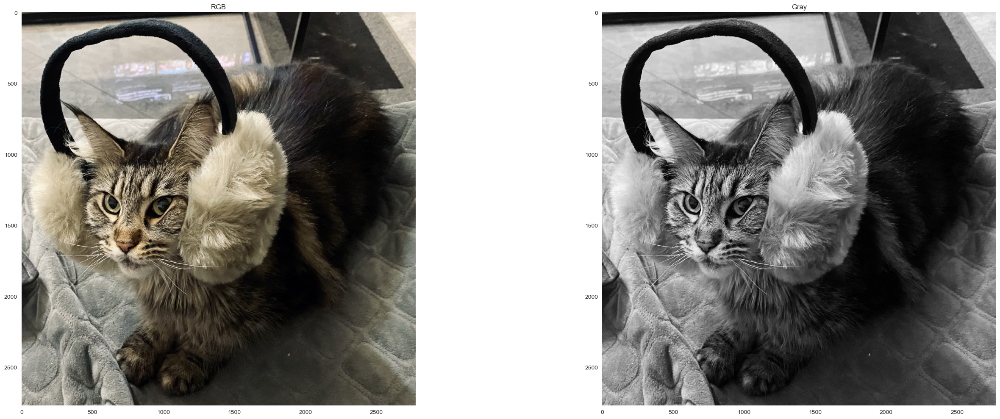

In [246]:
plt.subplot(1, 2, 1).set_title("RGB")
plt.imshow(buffy_rgb)

plt.subplot(1, 2, 2).set_title("Gray")
plt.imshow(buffy_gray, cmap="gray")

plt.tight_layout()

In [247]:
def img_2d_to_freq(img: np.ndarray):
    freq = scipy.fft.fft2(img)
    centered_freq = scipy.fft.fftshift(freq)
    return centered_freq

In [248]:
buffy_gray_freq = img_2d_to_freq(buffy_gray)

K = np.abs(buffy_gray_freq)
Phi = np.angle(buffy_gray_freq)

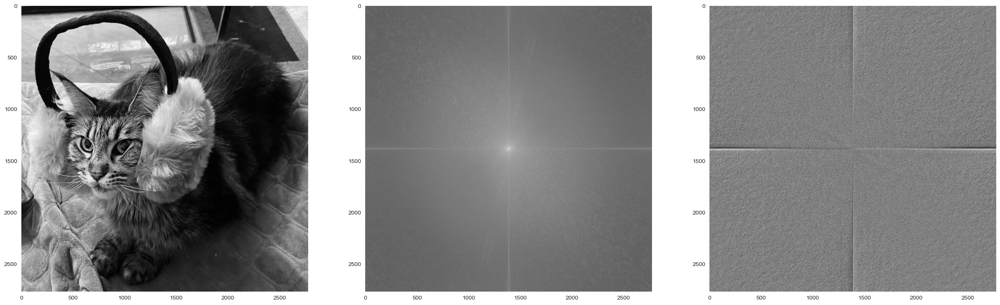

In [249]:
plt.subplot(1, 3, 1)
plt.imshow(buffy_gray, cmap="gray")

plt.subplot(1, 3, 2)
plt.imshow(K, cmap="gray", norm=LogNorm(1))

plt.subplot(1, 3, 3)
plt.imshow(Phi, cmap="gray")

In [250]:
def apply_low_pass_filter(freq, cutoff):
    rows, cols = freq.shape
    center = (rows // 2, cols // 2)

    mask = np.zeros((rows, cols), dtype=np.uint8)
    r = int(cutoff * min(rows, cols))
    cv2.circle(mask, center, r, 1, -1)

    freq_low_pass = freq * mask
    freq_low_pass[mask == 0] = 1

    return freq_low_pass


def apply_high_pass_filter(freq, cutoff):
    rows, cols = freq.shape
    center = (rows // 2, cols // 2)

    mask = np.ones((rows, cols), dtype=np.uint8)
    r = int(cutoff * min(rows, cols))
    cv2.circle(mask, center, r, 0, -1)

    freq_high_pass = freq * mask
    freq_high_pass[mask == 0] = 1

    return freq_high_pass


def apply_band_pass_filter(freq, low_cutoff, high_cutoff):
    rows, cols = freq.shape
    center = (rows // 2, cols // 2)

    mask_high = np.zeros((rows, cols), dtype=np.uint8)
    r_high = int(high_cutoff * min(rows, cols))
    cv2.circle(mask_high, center, r_high, 1, -1)

    mask_low = np.ones((rows, cols), dtype=np.uint8)
    r_low = int(low_cutoff * min(rows, cols))
    cv2.circle(mask_low, center, r_low, 0, -1)

    mask = mask_low * mask_high
    freq_band_pass = freq * mask
    freq_band_pass[mask == 0] = 1

    return freq_band_pass


def apply_band_stop_filter(freq, low_cutoff, high_cutoff):
    rows, cols = freq.shape
    center = (rows // 2, cols // 2)

    # band pass mask
    mask_high = np.zeros((rows, cols), dtype=np.uint8)
    r_high = int(high_cutoff * min(rows, cols))
    cv2.circle(mask_high, center, r_high, 1, -1)

    mask_low = np.ones((rows, cols), dtype=np.uint8)
    r_low = int(low_cutoff * min(rows, cols))
    cv2.circle(mask_low, center, r_low, 0, -1)

    # invert band pass to band stop mask
    mask = 1 - mask_low * mask_high
    freq_band_stop = freq * mask
    freq_band_stop[mask == 0] = 1

    return freq_band_stop

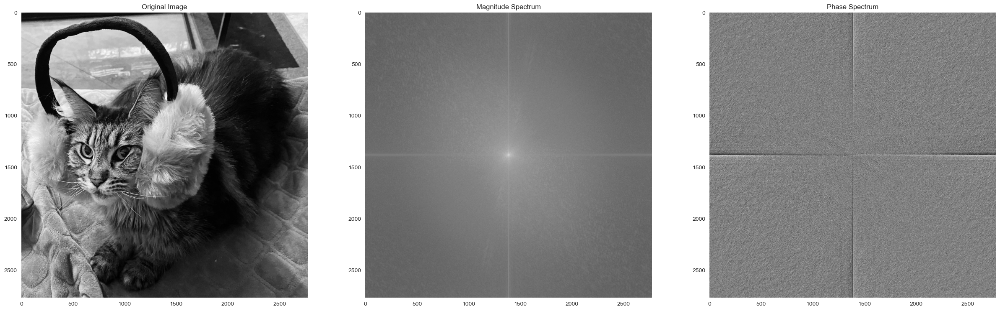

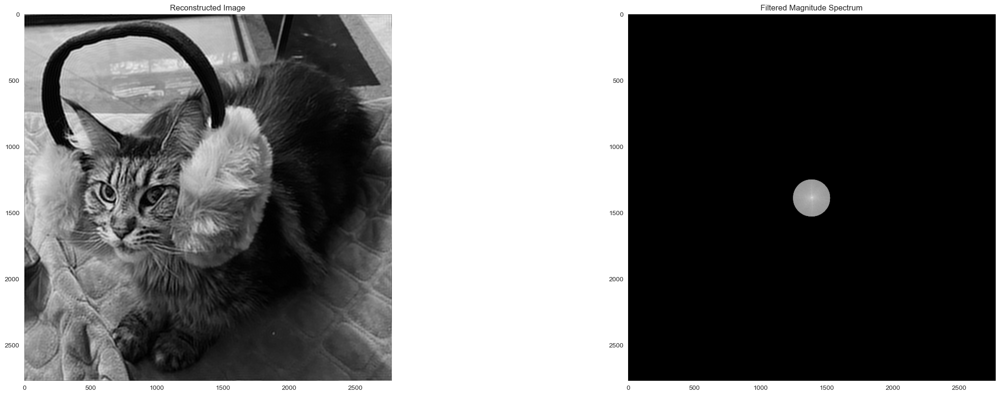

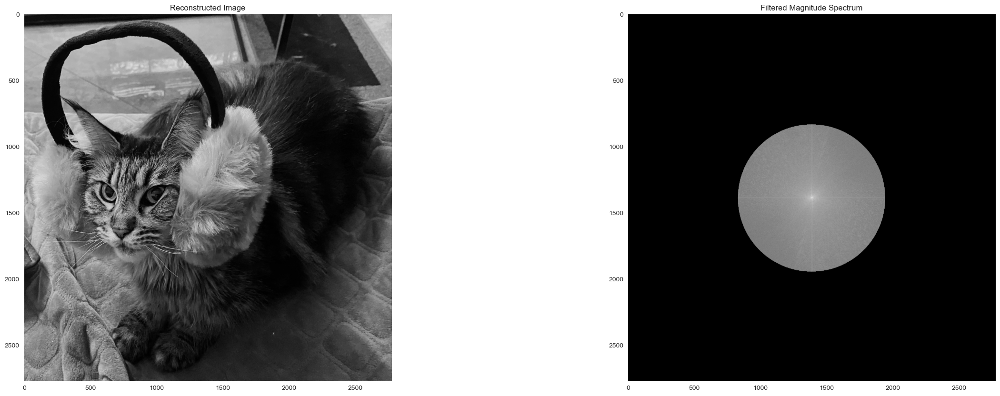

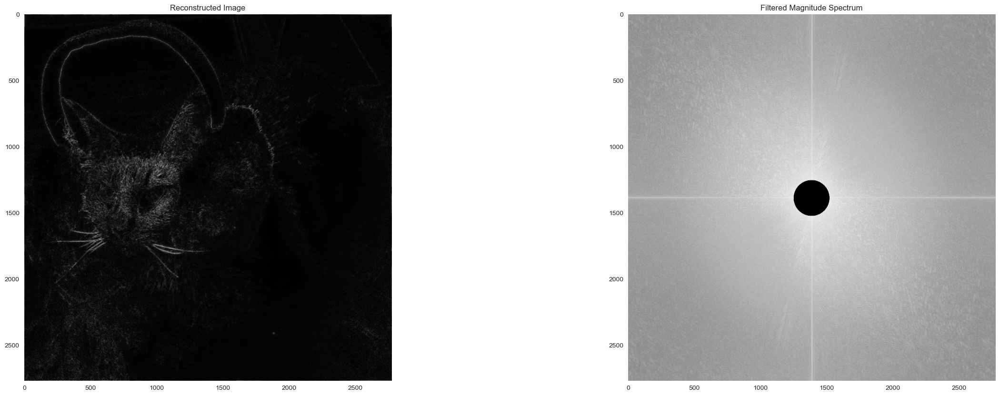

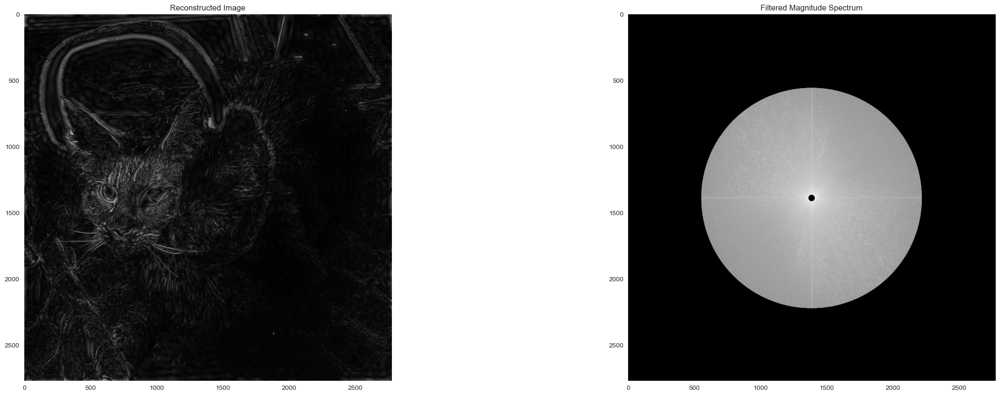

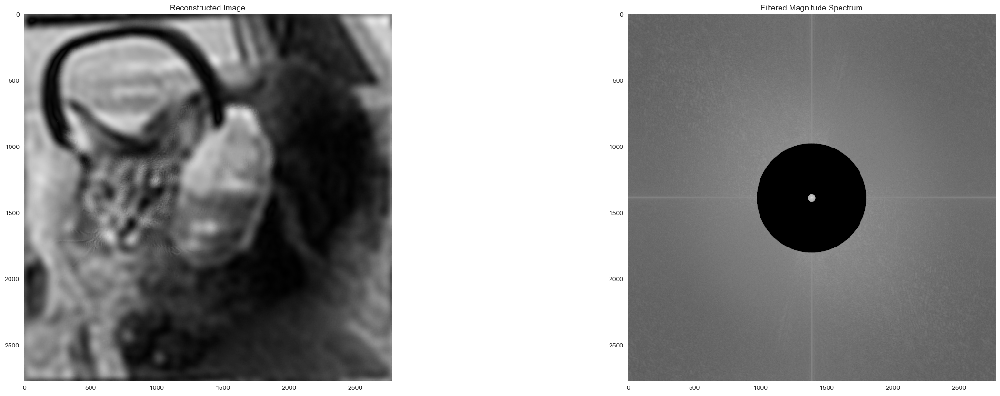

In [251]:
plt.subplot(1, 3, 1)
plt.imshow(buffy_gray, cmap="gray")
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(np.abs(buffy_gray_freq), cmap="gray", norm=LogNorm(1))
plt.title("Magnitude Spectrum")

plt.subplot(1, 3, 3)
plt.imshow(np.angle(buffy_gray_freq), cmap="gray")
plt.title("Phase Spectrum")

plt.show()

filters = [
    apply_low_pass_filter,
    apply_low_pass_filter,
    apply_high_pass_filter,
    apply_band_pass_filter,
    apply_band_stop_filter,
]

args = [
    {"cutoff": 0.05},
    {"cutoff": 0.2},
    {"cutoff": 0.05},
    {"low_cutoff": 0.01, "high_cutoff": 0.3},
    {"low_cutoff": 0.01, "high_cutoff": 0.15},
]

for filter_freq, args in zip(filters, args):

    freq_filtered = filter_freq(buffy_gray_freq, **args)
    reconstructed = scipy.fft.ifft2(freq_filtered)

    plt.subplot(1, 2, 1)
    plt.imshow(np.abs(reconstructed), cmap="gray")
    plt.title("Reconstructed Image")

    plt.subplot(1, 2, 2)
    plt.imshow(np.abs(freq_filtered), cmap="gray", norm=LogNorm(1))
    plt.title("Filtered Magnitude Spectrum")

    plt.show()

In [252]:
def apply_horizontal_filter(freq):
    rows, cols = freq.shape
    mask = np.zeros_like(freq)

    cutoff_cols = cols // 2
    mask[:, :cutoff_cols] = 1

    freq_low_pass = freq * mask
    freq_low_pass[mask == 0] = 1

    return freq_low_pass

def apply_vertical_filter(freq):
    rows, cols = freq.shape
    mask = np.zeros_like(freq)

    cutoff_rows = rows // 2
    mask[:cutoff_rows, :] = 1

    freq_low_pass = freq * mask
    freq_low_pass[mask == 0] = 1

    return freq_low_pass

def apply_diagonal_filter(freq):
    rows, cols = freq.shape
    mask = np.ones_like(freq)

    mask *= np.tri(*mask.shape)

    freq_low_pass = freq * mask
    freq_low_pass[mask == 0] = 1

    return freq_low_pass


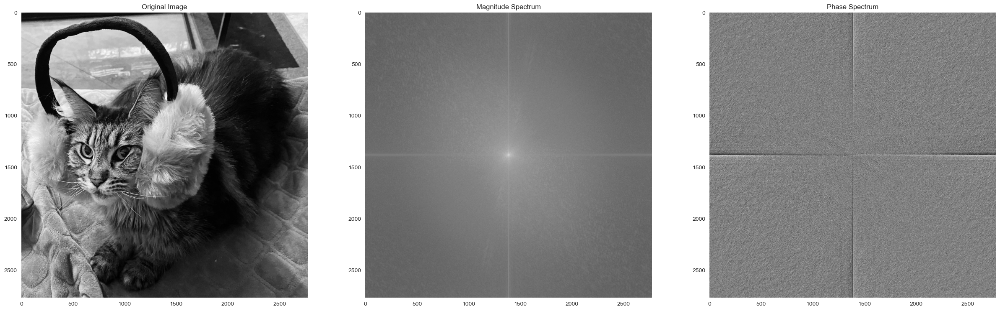

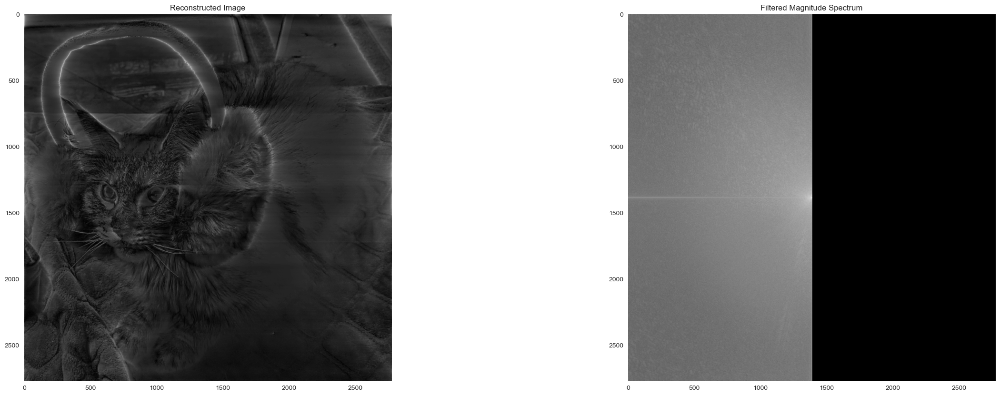

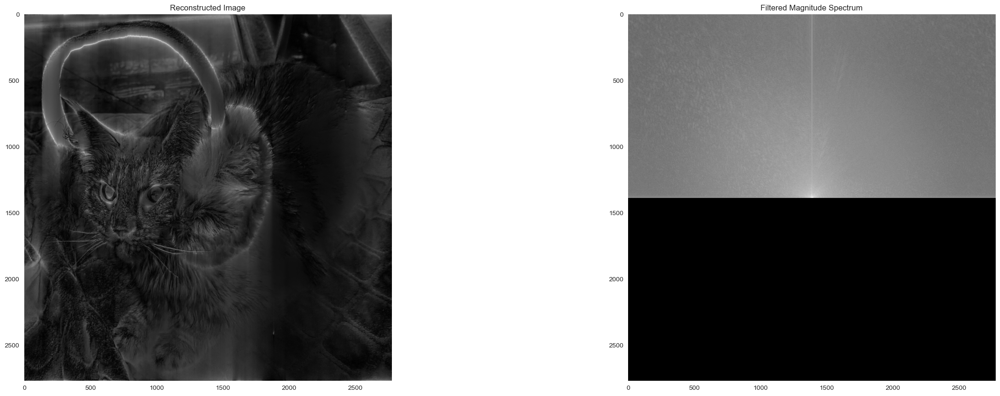

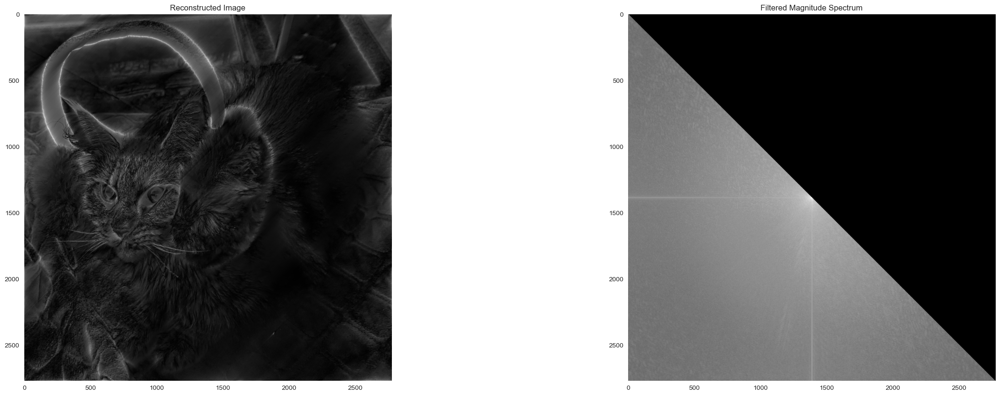

In [254]:
plt.subplot(1, 3, 1)
plt.imshow(buffy_gray, cmap="gray")
plt.title("Original Image")

plt.subplot(1, 3, 2)
plt.imshow(np.abs(buffy_gray_freq), cmap="gray", norm=LogNorm(1))
plt.title("Magnitude Spectrum")

plt.subplot(1, 3, 3)
plt.imshow(np.angle(buffy_gray_freq), cmap="gray")
plt.title("Phase Spectrum")

plt.show()

filters = [
    apply_horizontal_filter,
    apply_vertical_filter,
    apply_diagonal_filter,
]

for filter_freq in filters:
    freq_filtered = filter_freq(buffy_gray_freq)
    reconstructed = scipy.fft.ifft2(freq_filtered)

    plt.subplot(1, 2, 1)
    plt.imshow(np.abs(reconstructed), cmap="gray")
    plt.title("Reconstructed Image")

    plt.subplot(1, 2, 2)
    plt.imshow(np.abs(freq_filtered), cmap="gray", norm=LogNorm(1))
    plt.title("Filtered Magnitude Spectrum")

    plt.show()